# Image Captioning Final Project

In this final project you will define and train an image-to-caption model, that can produce descriptions for real world images!

<img src="https://github.com/hse-aml/intro-to-dl-pytorch/blob/main/week06/images/encoder_decoder.png?raw=1" style="width:70%">

Model architecture: CNN encoder and RNN decoder.
(https://research.googleblog.com/2014/11/a-picture-is-worth-thousand-coherent.html)

Alright, here's our plan:
* Take a pre-trained inception v3 to vectorize images
* Stack an LSTM on top of it
* Train the thing on MSCOCO

## Importing stuff and preparing data

In [1]:
%%bash

shred -u setup_colab.py

wget https://raw.githubusercontent.com/hse-aml/intro-to-dl-pytorch/main/utils/setup_colab.py -O setup_colab.py

shred: setup_colab.py: failed to open for writing: No such file or directory
--2023-09-08 06:07:05--  https://raw.githubusercontent.com/hse-aml/intro-to-dl-pytorch/main/utils/setup_colab.py
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.108.133, 185.199.109.133, 185.199.110.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.108.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 1649 (1.6K) [text/plain]
Saving to: ‘setup_colab.py’

     0K .                                                     100% 16.7M=0s

2023-09-08 06:07:05 (16.7 MB/s) - ‘setup_colab.py’ saved [1649/1649]



In [2]:
import setup_colab

setup_colab.setup_week06()

In [3]:
%%time

# Load dataset (vectorized images and captions)
import numpy as np
import json

# vectorized images from pretrained inceptionv3
img_codes = np.load('data/image_codes.npy')
# captions
captions = json.load(open('data/captions_tokenized.json'))

CPU times: user 174 ms, sys: 367 ms, total: 541 ms
Wall time: 541 ms


In [4]:
assert len(img_codes) == len(captions)
print(len(img_codes), len(captions))

118287 118287


In [5]:
print(f'Each image code is a 2048-unit vector [ shape: {img_codes.shape} ]')
print(img_codes[0,:10], end='\n\n')
print('For each image there are 5 reference captions')
print(*captions[0], sep='\n')

Each image code is a 2048-unit vector [ shape: (118287, 2048) ]
[0.3659946  0.2016555  0.9245725  0.57063824 0.547268   0.8275868
 0.3687277  0.12085301 0.0561931  0.49758485]

For each image there are 5 reference captions
people shopping in an open market for vegetables .
an open market full of people and piles of vegetables .
people are shopping at an open air produce market .
large piles of carrots and potatoes at a crowded outdoor market .
people shop for vegetables like carrots and potatoes at an open air market .


As you can see, all captions are already tokenized and lowercased. We now want to split them and add some special tokens for start/end of caption.

In [6]:
# split descriptions into tokens
for img_i in range(len(captions)):
    for caption_i in range(len(captions[img_i])):
        sentence = captions[img_i][caption_i]
        captions[img_i][caption_i] = ["#START#"] + \
                                     sentence.split(' ') + \
                                     ["#END#"]

In [7]:
print(*captions[0], sep='\n')

['#START#', 'people', 'shopping', 'in', 'an', 'open', 'market', 'for', 'vegetables', '.', '#END#']
['#START#', 'an', 'open', 'market', 'full', 'of', 'people', 'and', 'piles', 'of', 'vegetables', '.', '#END#']
['#START#', 'people', 'are', 'shopping', 'at', 'an', 'open', 'air', 'produce', 'market', '.', '#END#']
['#START#', 'large', 'piles', 'of', 'carrots', 'and', 'potatoes', 'at', 'a', 'crowded', 'outdoor', 'market', '.', '#END#']
['#START#', 'people', 'shop', 'for', 'vegetables', 'like', 'carrots', 'and', 'potatoes', 'at', 'an', 'open', 'air', 'market', '.', '#END#']


You don't want your network to predict a million-size vector of probabilities at each step, so we're gotta make some cuts.

We want you to count the occurences of each word so that we can decide which words to keep in our vocabulary.

In [8]:
# Build a Vocabulary
from collections import Counter
word_counts = Counter()

# Compute word frequencies for each word in captions. See code above for data
# structure
for img_captions in captions:
    for img_caption in img_captions:
        for word in img_caption:
            if word not in ['#UNK#', '#START#', '#END#', '#PAD#'] and \
               len(word) > 0:
               word_counts[word] += 1

In [9]:
print('Number of distinct (non special tokens) words: ', len(word_counts))

Number of distinct (non special tokens) words:  29413


In [10]:
# Find cutoff frequency so that all words which occur more frequently than the
# cutoff form 40% of the total words
word_count_freqs = Counter(word_counts.values())
n_words = len(word_counts)
retention = 0.60 * n_words
sum = 0
cutoff_freq = 0
while sum < retention:
    sum += word_count_freqs[cutoff_freq]
    cutoff_freq += 1

print('cutoff frequency:', cutoff_freq)

cutoff frequency: 4


In [11]:
vocab  = ['#UNK#', '#START#', '#END#', '#PAD#']
# Consider only words with frequency more than cutoff_freq = 4
vocab += [k for k, v in word_counts.items() if v > cutoff_freq if k not \
          in vocab]
n_tokens = len(vocab)

assert 10000 <= n_tokens <= 10500

word_to_index = {w: i for i, w in enumerate(vocab)}

In [12]:
eos_ix = word_to_index['#END#']
unk_ix = word_to_index['#UNK#']
pad_ix = word_to_index['#PAD#']

def as_matrix(sequences, max_len=None):
    """ Convert a list of tokens into a matrix with padding """
    max_len = max_len or max(map(len,sequences))

    matrix = np.full((len(sequences), max_len), pad_ix)
    for i,seq in enumerate(sequences):
        row_ix = [word_to_index.get(word, unk_ix) for word in seq[:max_len]]
        matrix[i, :len(row_ix)] = row_ix

    return matrix

In [13]:
# Try it out on several descriptions of a random image
example_c_ix = [1337, -2, -1]
for c_ix in example_c_ix:
    for c, m in zip(captions[c_ix], as_matrix(captions[c_ix])):
        print(c)
        print(m)
    print('\n')

['#START#', 'a', 'woman', 'sitting', 'in', 'front', 'of', 'a', 'laptop', 'computer', '.', '#END#']
[  1  24 262 140   6 159  14  24 858 155  12   2   3   3   3   3   3   3
   3]
['#START#', 'a', 'woman', 'looking', 'at', 'a', 'laptop', 'computer', '#END#']
[  1  24 262  53  18  24 858 155   2   3   3   3   3   3   3   3   3   3
   3]
['#START#', 'a', 'woman', 'is', 'at', 'work', 'on', 'her', 'computer', '#END#']
[  1  24 262  41  18 903  35 620 155   2   3   3   3   3   3   3   3   3
   3]
['#START#', 'the', 'young', 'woman', 'is', 'looking', 'at', 'her', 'lap', 'top', '.', '#END#']
[   1   45  115  262   41   53   18  620 1525   77   12    2    3    3
    3    3    3    3    3]
['#START#', 'a', 'woman', 'looking', 'at', 'a', 'laptop', ',', 'with', 'the', 'sun', 'cause', 'a', 'glare', 'on', 'the', 'screen', '.', '#END#']
[   1   24  262   53   18   24  858  123   58   45  276 3641   24 3642
   35   45 1128   12    2]


['#START#', 'a', "women's", 'tennis', 'doubles', 'match', 'on', 'a'

## Building our neural network
As we mentioned earlier, we shall build an rnn "language-model" conditioned on vectors from the convolutional part.

<img src="https://github.com/yunjey/pytorch-tutorial/raw/master/tutorials/03-advanced/image_captioning/png/model.png" style="width:70%">

In [14]:
import torch
from torch import nn
import torch.nn.functional as F

In [15]:
class CaptionNet(nn.Module):

    def __init__(self,
                 n_tokens=n_tokens,
                 emb_size=128,
                 lstm_units=256,
                 cnn_feature_size=2048):
        """
        A recurrent 'head' network for image captioning. See scheme above.
        """
        super().__init__()

        # a layer that converts conv features to initial_h (h_0) and
        # initial_c (c_0)
        self.cnn_to_h0 = nn.Linear(in_features=cnn_feature_size,
                                   out_features=lstm_units)
        self.cnn_to_c0 = nn.Linear(in_features=cnn_feature_size,
                                   out_features=lstm_units)

        # create embedding for input words. Use the parameters (e.g. emb_size).
        self.embedding = nn.Embedding(num_embeddings=n_tokens,
                                      embedding_dim=emb_size)

        # lstm: create a recurrent core of your network. Use either LSTMCell or
        # just LSTM.
        # In the latter case (nn.LSTM), make sure batch_first=True
        self.lstm = nn.LSTM(input_size=emb_size,
                            hidden_size=lstm_units,
                            batch_first=True)

        # create logits: linear layer that takes lstm hidden state as input and
        # computes one number per token
        self.logits = nn.Linear(in_features=lstm_units,
                                out_features=n_tokens)


    def forward(self, image_vectors, captions_ix):
        """
        Apply the network in training mode.
        :param image_vectors: torch tensor containing inception vectors.
         shape: [batch, cnn_feature_size]
        :param captions_ix: torch tensor containing captions as matrix.
         shape: [batch, word_i].
            padded with pad_ix
        :returns: logits for next token at each tick,
         shape: [batch, word_i, n_tokens]
        """

        self.lstm.flatten_parameters()

        initial_cell = self.cnn_to_c0(image_vectors)
        initial_hid = self.cnn_to_h0(image_vectors)

        # compute embeddings for captions_ix
        captions_ix_emb = self.embedding(captions_ix)

        # apply recurrent layer to captions_emb.
        # 1. initialize lstm state with initial_* from above
        # 2. feed it with captions. Mind the dimension order in docstring
        # 3. compute logits for next token probabilities
        # Note: if you used nn.LSTM, you can just give it
        # (initial_cell[None], initial_hid[None]) as second arg

        # lstm_out should be lstm hidden state sequence of shape
        # [batch, caption_length, lstm_units]
        init_state = (initial_cell[None], initial_hid[None])
        lstm_out, lstm_hid = self.lstm(captions_ix_emb, init_state)

        # compute logits from lstm_out
        logits = self.logits(lstm_out)

        return logits

In [16]:
network = CaptionNet(n_tokens)

In [17]:
dummy_img_vec = torch.randn(len(captions[0]), 2048)
dummy_capt_ix = torch.tensor(as_matrix(captions[0]), dtype=torch.int64)

dummy_logits = network.forward(dummy_img_vec, dummy_capt_ix)
print('dummy_img_vec shape:', dummy_img_vec.shape)
print('dummy_capt_ix shape:', dummy_capt_ix.shape)
print('logits shape:', dummy_logits.shape)
assert dummy_logits.shape == \
        (dummy_capt_ix.shape[0], dummy_capt_ix.shape[1], n_tokens)

dummy_img_vec shape: torch.Size([5, 2048])
dummy_capt_ix shape: torch.Size([5, 16])
logits shape: torch.Size([5, 16, 10403])


In [18]:
def compute_loss(network, image_vectors, captions_ix):
    """
    :param image_vectors: torch tensor containing inception vectors.
     shape: [batch, cnn_feature_size]
    :param captions_ix: torch tensor containing captions as matrix.
     shape: [batch, word_i].
        padded with pad_ix
    :returns: crossentropy (neg llh) loss for next captions_ix given previous
     ones. Scalar float tensor
    """

    # captions for input - all except last because we don't know next token for
    # last one.
    captions_ix_inp = captions_ix[:, :-1].contiguous()
    captions_ix_next = captions_ix[:, 1:].contiguous()

    # apply the network, get predictions for captions_ix_next
    logits_for_next = network.forward(image_vectors, captions_ix_inp)

    # compute the loss function between logits_for_next and captions_ix_next
    # Use the mask!
    # Make sure that predicting next tokens after EOS do not contribute to loss
    # You can do that either by multiplying elementwise loss by
    # (captions_ix_next != pad_ix)
    # or by using ignore_index in some losses.
    loss = F.cross_entropy(logits_for_next.reshape( \
     (-1, logits_for_next.shape[2])), captions_ix_next.reshape(-1), \
                           ignore_index=pad_ix)

    return loss

In [19]:
dummy_loss = compute_loss(network, dummy_img_vec, dummy_capt_ix)
print('dummy_loss:', dummy_loss)
assert len(dummy_loss.shape) <= 1, 'loss must be scalar'
assert dummy_loss.data.numpy() > 0, ("did you forget the 'negative' part of",
                                     "negative log-likelihood")

dummy_loss.backward()

assert all(param.grad is not None for param in network.parameters()), \
    'loss should depend differentiably on all neural network weights'

dummy_loss: tensor(9.2621, grad_fn=<NllLossBackward0>)


## Batch generator

In [20]:
from sklearn.model_selection import train_test_split

captions = np.array(captions, dtype='object')
train_img_codes, val_img_codes, train_captions, val_captions = train_test_split(
    img_codes, captions, test_size=0.1, random_state=42
)

In [21]:
from random import choice

def generate_batch(img_codes, captions, batch_size, max_caption_len=None):

    # sample random numbers for image/caption indicies
    random_image_ix = np.random.randint(0, len(img_codes), size=batch_size)

    # get images
    batch_images = img_codes[random_image_ix]

    # 5-7 captions for each image
    captions_for_batch_images = captions[random_image_ix]

    # pick one from a set of captions for each image
    batch_captions = list(map(choice,captions_for_batch_images))

    # convert to matrix
    batch_captions_ix = as_matrix(batch_captions,max_len=max_caption_len)

    return torch.tensor(batch_images, dtype=torch.float32), \
        torch.tensor(batch_captions_ix, dtype=torch.int64)

In [22]:
generate_batch(img_codes, captions, 3)

(tensor([[0.1308, 0.1172, 0.1852,  ..., 0.4241, 0.2331, 0.6876],
         [0.7265, 1.0356, 0.2647,  ..., 0.5796, 0.3559, 1.8403],
         [0.0034, 0.3957, 0.1656,  ..., 0.1736, 0.4014, 0.2375]]),
 tensor([[   1,   24,  599,  672,   53,  590,   45,   71,   18,   45,  674,   12,
             2],
         [   1,  112,  570,   17,  148,  248,  374,    7, 4074,   12,    2,    3,
             3],
         [   1,   24,  158,   63,  136,   24,  288,  274,  497,   35,  156,   12,
             2]]))

## Train and validate

In [23]:
from tqdm import notebook
from IPython.display import clear_output

In [24]:
DEVICE = torch.device('cuda:0') if torch.cuda.is_available() else \
            torch.device('cpu')
print('DEVICE:', DEVICE)

DEVICE: cuda:0


In [25]:
network = CaptionNet(n_tokens).to(DEVICE)
optimizer = torch.optim.Adam(network.parameters(), lr=1e-3)

batch_size = 128
n_epochs = 16
n_batches_per_epoch = 64
# how many batches are used for validation after each epoch
n_validation_batches = 8

In [26]:
def train_network(train_img_codes,
                  train_captions,
                  val_img_codes,
                  val_captions,
                  network,
                  optimizer,
                  batch_size=128,
                  n_epochs=100,
                  convergence_threshold=-np.inf):

    n_train = len(train_captions)
    n_val = len(val_captions)
    n_batches_per_epoch = n_train // batch_size
    n_validation_batches = n_val // batch_size
    prev_train_loss = np.inf

    for epoch in range(n_epochs):
        train_loss = 0
        network.train()
        for _ in notebook.tqdm(range(n_batches_per_epoch)):
            images, captions = generate_batch(train_img_codes, train_captions, batch_size)
            images = images.to(DEVICE)
            captions = captions.to(DEVICE)

            loss_t = compute_loss(network, images, captions)

            # clear old gradients;
            # do a backward pass to get new gradients;
            # then train with opt
            optimizer.zero_grad()
            loss_t.backward()
            optimizer.step()

            train_loss += loss_t.detach().cpu().numpy()

        train_loss /= n_batches_per_epoch

        val_loss = 0
        network.eval()
        for _ in range(n_validation_batches):
            images, captions = generate_batch(val_img_codes, val_captions, batch_size)
            images = images.to(DEVICE)
            captions = captions.to(DEVICE)

            with torch.no_grad():
                loss_t = compute_loss(network, images, captions)

            val_loss += loss_t.detach().cpu().numpy()

        val_loss /= n_validation_batches

        print('\nEpoch: {}, train loss: {}, val loss: {}'.format(epoch, train_loss, val_loss))

        if prev_train_loss - train_loss < convergence_threshold:
            print('Converged')
            break
        prev_train_loss = train_loss

    print("Finished!")
    return network

In [27]:
nw = train_network(train_img_codes,
                   train_captions,
                   val_img_codes,
                   val_captions,
                   network,
                   optimizer,
                   batch_size,
                   n_epochs
                   )

  0%|          | 0/831 [00:00<?, ?it/s]


Epoch: 0, train loss: 3.7824499868170305, val loss: 3.1208139346993486


  0%|          | 0/831 [00:00<?, ?it/s]


Epoch: 1, train loss: 2.944720161520617, val loss: 2.8456360231275144


  0%|          | 0/831 [00:00<?, ?it/s]


Epoch: 2, train loss: 2.7373755032692, val loss: 2.7316183655158333


  0%|          | 0/831 [00:00<?, ?it/s]


Epoch: 3, train loss: 2.628416421181028, val loss: 2.634729328362838


  0%|          | 0/831 [00:00<?, ?it/s]


Epoch: 4, train loss: 2.558867301895013, val loss: 2.594028493632441


  0%|          | 0/831 [00:00<?, ?it/s]


Epoch: 5, train loss: 2.5059524305460688, val loss: 2.5505074107128642


  0%|          | 0/831 [00:00<?, ?it/s]


Epoch: 6, train loss: 2.4668866948243657, val loss: 2.5133326675580894


  0%|          | 0/831 [00:00<?, ?it/s]


Epoch: 7, train loss: 2.4290175176843123, val loss: 2.48832601049672


  0%|          | 0/831 [00:00<?, ?it/s]


Epoch: 8, train loss: 2.402535194954717, val loss: 2.468956841074902


  0%|          | 0/831 [00:00<?, ?it/s]


Epoch: 9, train loss: 2.3788587676919324, val loss: 2.4837591622186745


  0%|          | 0/831 [00:00<?, ?it/s]


Epoch: 10, train loss: 2.355913593737514, val loss: 2.4674945862396904


  0%|          | 0/831 [00:00<?, ?it/s]


Epoch: 11, train loss: 2.3407636928214064, val loss: 2.4421191837476646


  0%|          | 0/831 [00:00<?, ?it/s]


Epoch: 12, train loss: 2.3255041314089486, val loss: 2.447080301201862


  0%|          | 0/831 [00:00<?, ?it/s]


Epoch: 13, train loss: 2.3108889350822257, val loss: 2.4320986841035928


  0%|          | 0/831 [00:00<?, ?it/s]


Epoch: 14, train loss: 2.294727924785316, val loss: 2.4248349770255713


  0%|          | 0/831 [00:00<?, ?it/s]


Epoch: 15, train loss: 2.284263455050086, val loss: 2.4377580803373586
Finished!


## Generating caption

The function below creates captions by sampling from probabilities defined by the net.

The implementation used here is simple but inefficient (quadratic in lstm steps). We keep it that way since it isn't a performance bottleneck.

In [28]:
from beheaded_inception3 import beheaded_inception_v3

inception = beheaded_inception_v3().eval()

def generate_caption(network,
                     image,
                     caption_prefix = ('#START#',),
                     t=1,
                     sample=True,
                     max_len=100):
    network = network.cpu().eval()

    assert isinstance(image, np.ndarray) and np.max(image) <= 1\
           and np.min(image) >= 0 and image.shape[-1] == 3

    image = torch.tensor(image.transpose([2, 0, 1]), dtype=torch.float32)

    vectors_8x8, vectors_neck, logits = inception(image[None])
    caption_prefix = list(caption_prefix)

    for _ in range(max_len):

        prefix_ix = as_matrix([caption_prefix])
        prefix_ix = torch.tensor(prefix_ix, dtype=torch.int64)
        next_word_logits = network.forward(vectors_neck, prefix_ix)[0, -1]
        next_word_probs = F.softmax(next_word_logits, -1).detach().numpy()

        assert len(next_word_probs.shape) == 1, 'probs must be one-dimensional'
        # apply temperature
        next_word_probs = next_word_probs ** t / np.sum(next_word_probs ** t)

        if sample:
            next_word = np.random.choice(vocab, p=next_word_probs)
        else:
            next_word = vocab[np.argmax(next_word_probs)]

        caption_prefix.append(next_word)

        if next_word == '#END#':
            break

    return ' '.join(caption_prefix[1:-1])

/usr/local/lib/python3.10/dist-packages/torchvision/models/inception.py:43: FutureWarning: The default weight initialization of inception_v3 will be changed in future releases of torchvision. If you wish to keep the old behavior (which leads to long initialization times due to scipy/scipy#11299), please set init_weights=True.
  warnings.warn(
Downloading: "https://download.pytorch.org/models/inception_v3_google-1a9a5a14.pth" to /root/.cache/torch/hub/checkpoints/inception_v3_google-1a9a5a14.pth
100%|██████████| 104M/104M [00:01<00:00, 102MB/s]


## Validating qualitatively

We have downloaded 30 images from validation set of `MSCOCO`, they are located in data folder and named `img_i.jpg` for `i` from 0 to 29.


In [39]:
import matplotlib.pyplot as plt
from skimage.transform import resize

In [40]:
# read images from disc
test_imgs = []
for i in range(30):
    img = plt.imread(f'data/img_{i}')
    img = resize(img, (299, 299))
    test_imgs.append(img)

a double decker bus parked in front of a building .
a double decker bus driving down a street .
a double decker bus driving down a street .


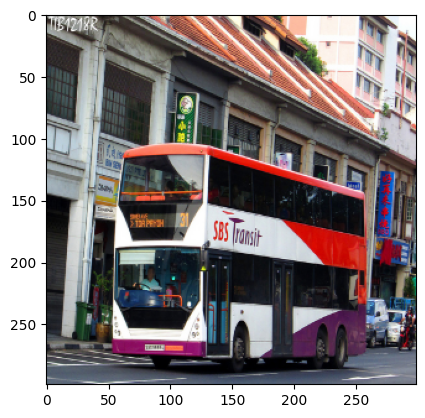

a black bear walking across a lush green field .
a black bear walking across a lush green field .
a black bear walking through a forest with trees in the background .


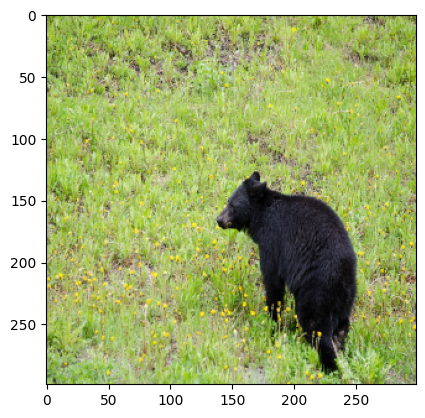

a glass of wine sitting on top of a table .
a glass of wine sitting on top of a table .
a glass vase filled with water and a glass of wine .


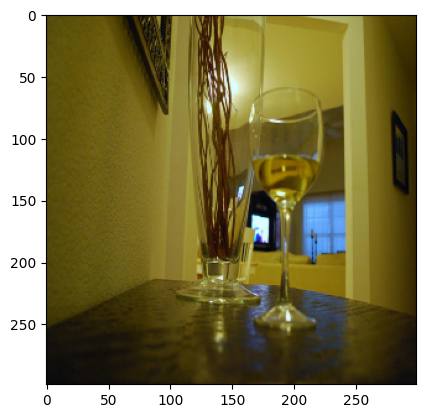

a statue of a man with a hat on his head .
a stuffed bear sitting on a wooden bench .
a stuffed bear sitting on a wooden bench .


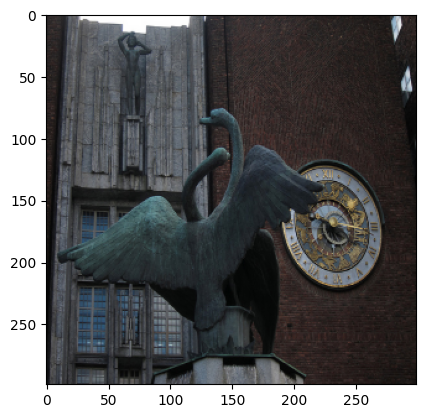

a person is standing in front of a car window .
a man is standing next to a car window .
a man is standing next to a parked car .


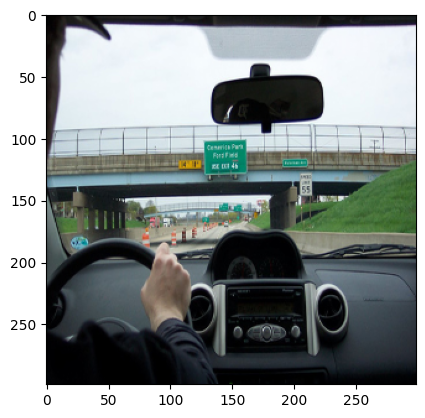

a horse rider is riding a horse in a park .
a horse that is standing in the dirt .
a man riding a horse with a dog on the back of it .


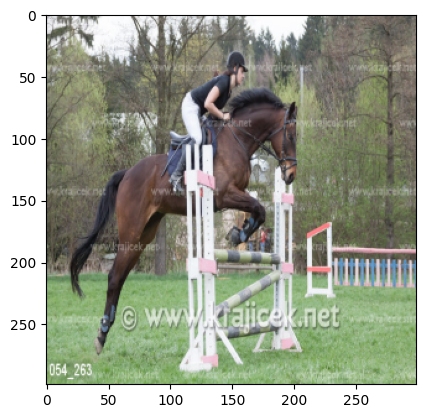

a man holding a kite on a beach .
a person on a beach flying a kite .
a man and a woman are on a beach .


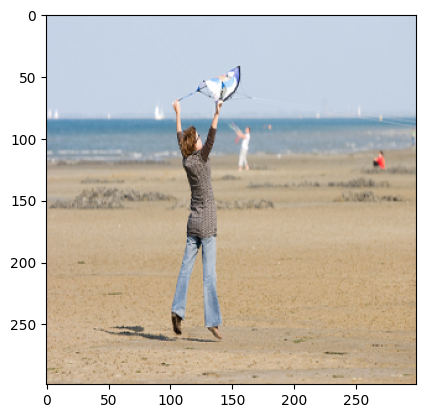

a clock tower with a weather vane on top .
a large clock tower with a clock on it .
a large clock tower with a clock on it .


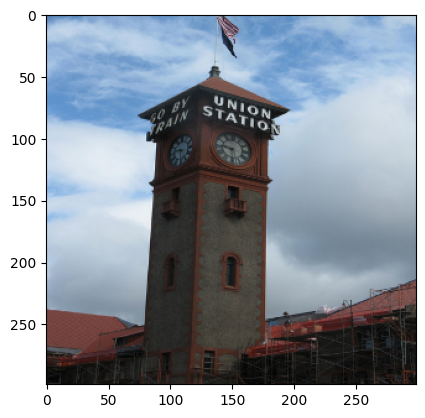

a woman sitting on a couch with a remote control in her hand .
a woman sitting on a couch with a remote control .
a young boy sitting on a couch with a remote control .


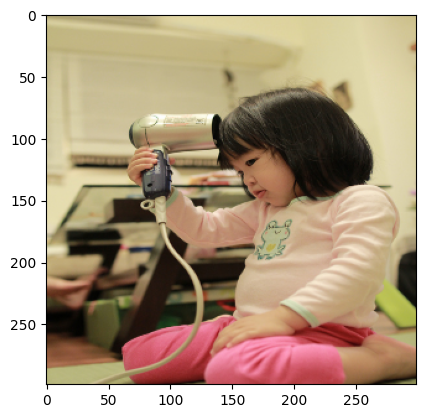

a dog sitting on a bench in the middle of a city street .
a bicycle is parked next to a brick wall .
a dog sitting on a bench next to a fire hydrant .


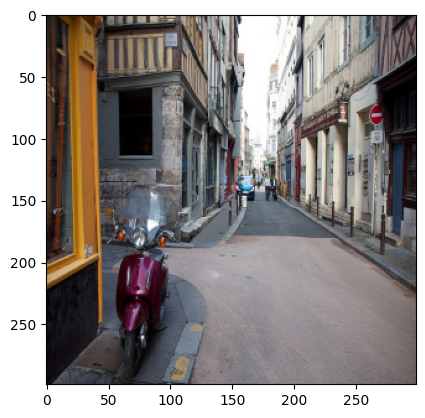

a group of people sitting at a table with laptops .
a group of people sitting at a table with laptops .
a group of people sitting at a table with laptops .


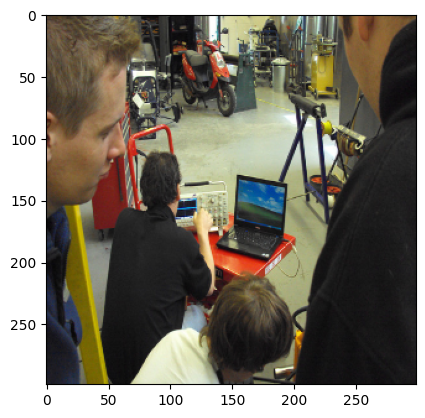

a man is playing a game of soccer .
a man playing a game of soccer on a field .
a man is playing a game of soccer .


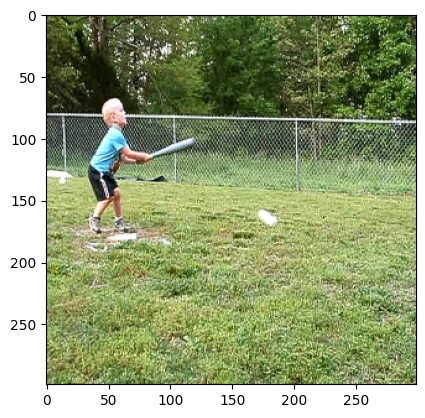

a woman and a man sitting at a table with a cake .
a woman sitting at a table with a cake on it .
a woman is sitting at a table with a cake on it .


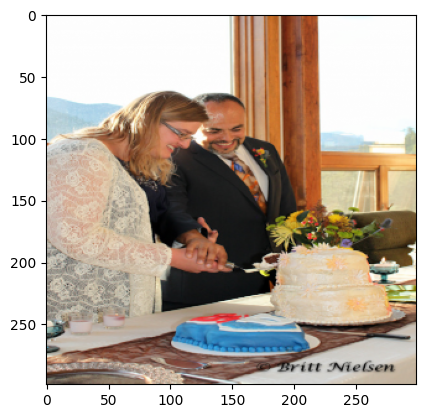

a group of people standing around a table with a cake .
a group of people sitting at a table with a cake .
a group of people standing around a table with a teddy bear .


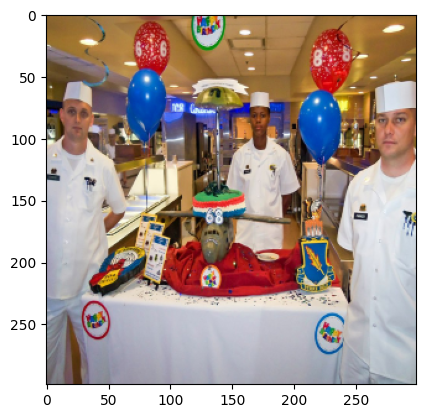

a bathroom with a toilet and a sink .
a bathroom with a toilet , sink and a window .
a bathroom with a toilet and a sink .


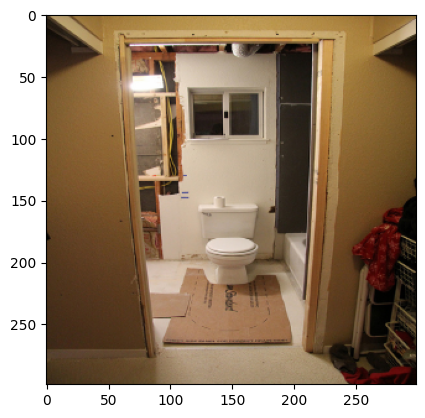

a giraffe is standing in a field of grass .
a giraffe standing in a field of grass .
a giraffe standing in a field next to a tree .


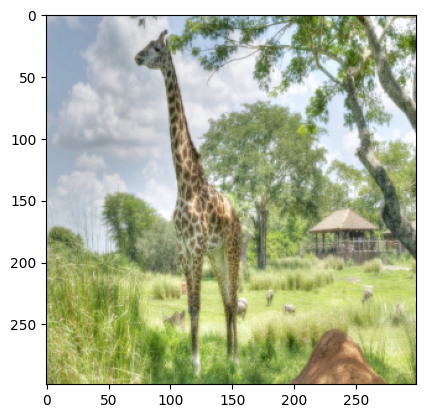

a white toilet sitting next to a trash can .
a white toilet sitting next to a trash can .
a white toilet sitting next to a white toilet .


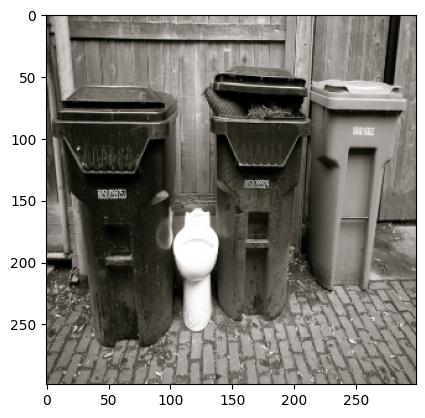

a group of people sitting on a boat in the water .
a group of people sitting on a boat in the water .
a group of people standing in a canoe in the water .


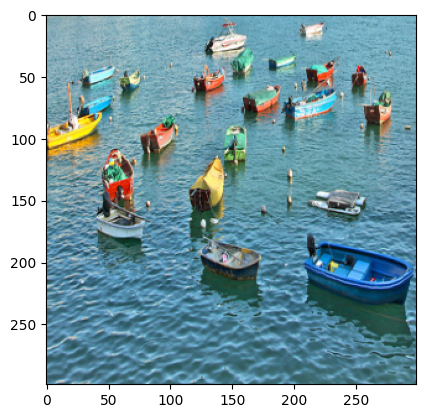

a piece of pizza with a knife on top of it .
a slice of pizza on a white plate .
a piece of pizza with a knife on top of it .


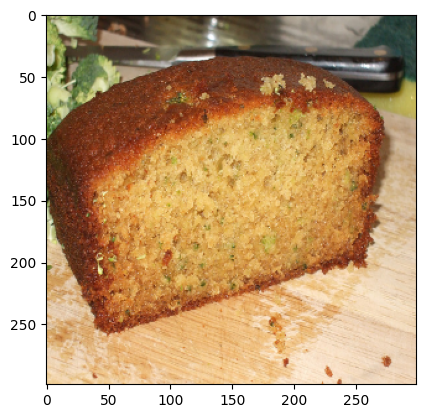

a group of giraffes standing in a field .
a group of giraffes standing next to each other .
a group of giraffes standing in a field .


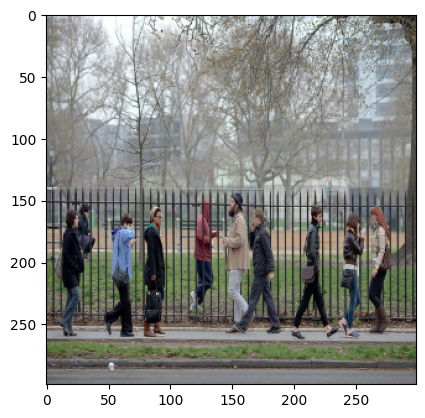

a plate with a sandwich and a sandwich on it .
a plate with a sandwich and a sandwich on it
a plate with a sandwich and a cup of coffee on a table .


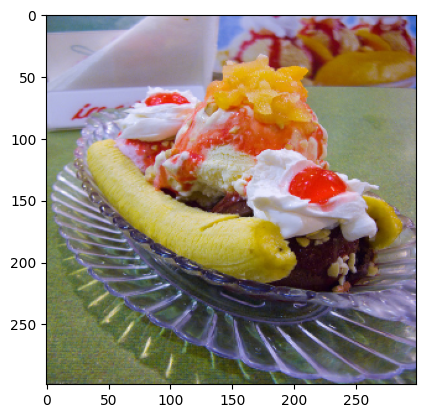

a double decker bus driving down a street .
a double decker bus driving down a street .
a double decker bus driving down a street .


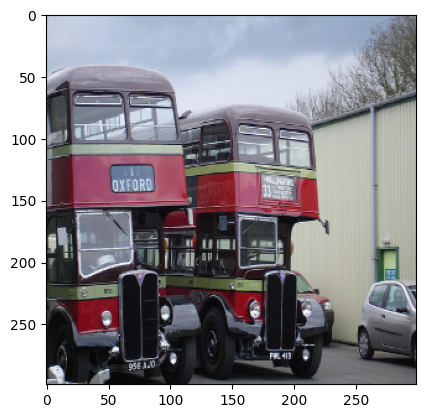

a large tower with a clock on it .
a large white clock tower with a sky background
a large building with a clock on it .


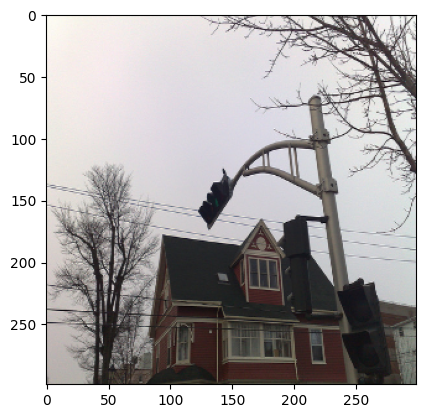

a bed with a black blanket on top of a bed .
a bed with a pillow and a small bed in it
a bed with a pillow and a mirror on it .


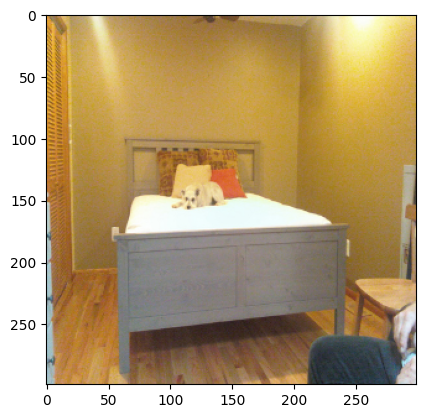

a fire hydrant sitting on the side of a road .
a fire hydrant sitting on the side of a road .
a fire hydrant sitting on the side of a road .


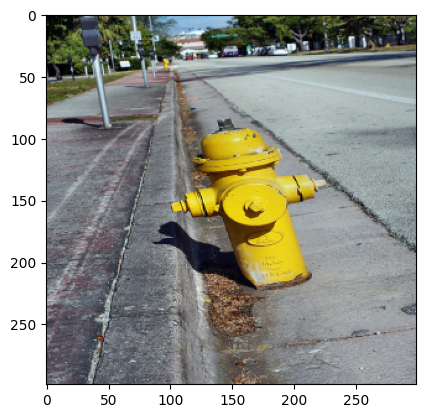

a person on a snowboard jumping in the air .
a person on a snowboard jumping in the air .
a person on a snowboard in the snow .


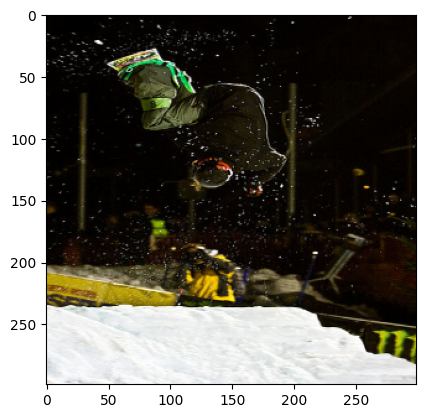

a group of people walking down a street with umbrellas .
a group of people walking down a street with umbrellas .
a group of people walking down a street with a umbrella .


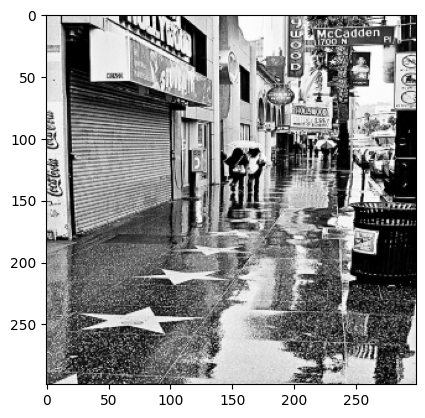

a bench sitting in the middle of a field .
a bench sitting in the middle of a field .
a bench sitting in the middle of a field .


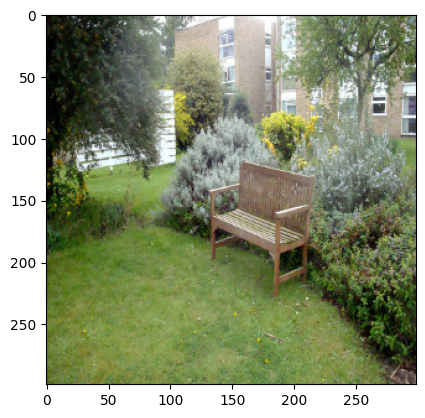

a large airplane is parked on a runway .
a large airplane is parked on a runway .
a large plane is parked on the runway .


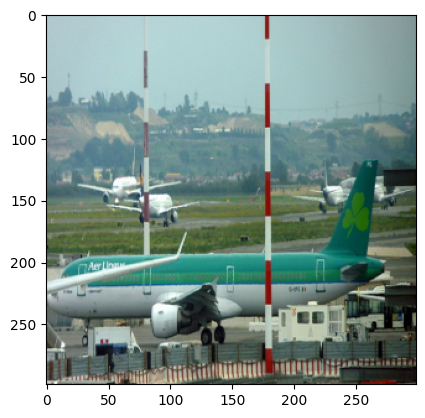

a group of people sitting around a table with a wii controller .
a group of people sitting around a table with a dog .
a group of people sitting around a table with a remote .


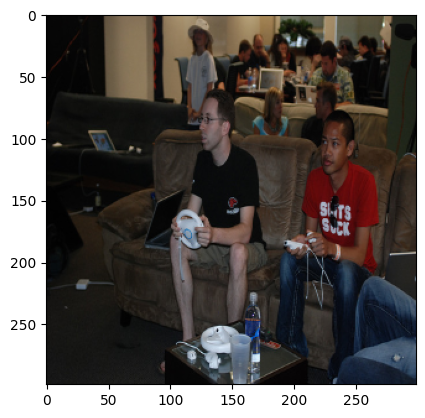

In [41]:
for img in test_imgs:
    plt.imshow(img)
    for i in range(3):
        print(generate_caption(network, img, t=5.))
    plt.show()